<img alt="Colaboratory logo" width="100%" src="https://raw.githubusercontent.com/thiagolopes97/Portifolio_Projetos/main/images/headbanner.png">

#### **2º Projeto desenvolvido no Data Science na Prática 2.0**
*by [Thiago Lopes](https://github.com/thiagolopes97/Portifolio_Projetos)*

---
# Analisando a Violência no Rio de Janeiro

<img alt="Rio de Janeiro" width="195%" src="https://image.freepik.com/free-photo/landscape-rio-de-janeiro-surrounded-by-sea-blue-sky-brazil_181624-14153.jpg">

É fato que a violência atinge todas as cidades do Brasil, e vem ganhando destaque nos noticiários, cada vez mais. 

Gostaria de começar a introdução desta análise citando um famoso filme brasileiro que retrata a violência no Rio de Janeiro.Se você é brasileiro ou mora  no Brasil, certamente já ouviu falar/ ou viu o filme Tropa de Elite. É uma produção cinematográfica policial brasileira de 2007, com o gênero drama/filme policial, dirigido por José Padilha e que retrata a violência urbana no Rio. Nele é abordado o sangrento e hostil embate entre polícia e bandidos. Desde 2007 até hoje em dia, a violência infelizmente continua a crescer.

Atualmente, as leis de acesso à informação e a conscientização dos órgãos públicos, vêm proporcionando a disponibilização de várias fontes de dados. Como exemplo, o governo do Rio de Janeiro traz a iniciativa do [portal ISPDados](http://www.ispdados.rj.gov.br/). 

Faremos uma análise em cima dos indicadores estatísticos da violência no Rio, explorando algumas das variáveis fornecidas.

**Este Notebook tem por intenção explorar alguns dos dados fornecidos pelo [ISPDados](http://www.ispdados.rj.gov.br/) e a análise aqui demonstrada foi realizada em 27 de Dez de 2021**

## Obtenção dos Dados


Os dados foram obtidos diretamento do portal ISPDados, que é uma página de Dados Abertos do Instituto de Segurança Pública do Rio de Janeiro.

As estatísticas divulgadas no portal são construídas a partir dos Registros de Ocorrência (RO) lavrados nas delegacias de Polícia Civil do Estado do Rio de Janeiro, além de informações complementares de órgãos específicos da Polícia Militar do Estado do Rio de Janeiro.

Como forma de criar um controle de qualidade, antes de serem consolidados no ISP os RO são submetidos à Corregedoria Interna da Polícia Civil (COINPOL). As estatísticas produzidas baseiam-se na data em que foi confeccionado o Registro de Ocorrência.

No caso do *dataset* a ser utilizado aqui, os arquivos `csv` são obtidos diretamente do ISPDados, presentes [neste link](http://www.ispdados.rj.gov.br/estatistica.html).

### Importando os dados

In [1]:
# Importação das bibliotecas
import datetime as dt
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

'''
Nota: Dados com errata até semtembro de 2020, atualizados em fevereiro de 2021.
Nota: O Instituto de Segurança Pública publica desde outubro de 2016, com periodicidade
mensal, dados estatísticos relativos à incidência de feminicídio e de tentativa de
feminicídio, cumprindo assim o que foi determinado pela lei nº 7.448 de 13 de outubro de
2016. Cabe ressaltar que as vítimas contabilizadas nos títulos feminícidio e tentativa de
feminicídio também são contabilizadas nos títulos homicídio doloso e tentativa de
homicídio, respectivamente, presentes nos dados oficiais divulgados mensalmente pelo
ISP. Sendo assim, não se deve operar a soma de vítimas de feminicídio (ou de tentativa de
feminicídio) com vítimas de homicídio (ou de tentativa de homicídio), pois se estaria
incorrendo em dupla contagem de vítimas.
'''
df = pd.read_csv('http://www.ispdados.rj.gov.br/Arquivos/DOMensalEstadoDesde1991.csv',sep=";",na_values=' ')
armas = pd.read_excel('http://www.ispdados.rj.gov.br/Arquivos/ArmasApreendidasEvolucaoCisp.xlsx')
fem = pd.read_csv('http://www.ispdados.rj.gov.br/Arquivos/BaseFeminicidioEvolucaoMensalCisp.csv',sep=';')


In [2]:
df.head(3)

,ano,mes,hom_doloso,lesao_corp_morte,latrocinio,cvli,hom_por_interv_policial,letalidade_violenta,tentat_hom,lesao_corp_dolosa,estupro,hom_culposo,lesao_corp_culposa,roubo_transeunte,roubo_celular,roubo_em_coletivo,roubo_rua,roubo_veiculo,roubo_carga,roubo_comercio,roubo_residencia,roubo_banco,roubo_cx_eletronico,roubo_conducao_saque,roubo_apos_saque,roubo_bicicleta,outros_roubos,total_roubos,furto_veiculos,furto_transeunte,furto_coletivo,furto_celular,furto_bicicleta,outros_furtos,total_furtos,sequestro,extorsao,sequestro_relampago,estelionato,apreensao_drogas,posse_drogas,trafico_drogas,apreensao_drogas_sem_autor,recuperacao_veiculos,apf,aaapai,cmp,cmba,ameaca,pessoas_desaparecidas,encontro_cadaver,encontro_ossada,pol_militares_mortos_serv,pol_civis_mortos_serv,registro_ocorrencias,fase
0,1991,1,657,NaN,15,NaN,NaN,672,162,3051,NaN,NaN,NaN,967,NaN,381,1348,1174,63,350,188,37,NaN,NaN,NaN,NaN,158,3318,2009,1147,NaN,NaN,NaN,3561,6717,NaN,NaN,NaN,NaN,133,NaN,NaN,NaN,872,NaN,NaN,NaN,NaN,NaN,NaN,217,NaN,NaN,NaN,NaN,3
1,1991,2,732,NaN,17,NaN,NaN,749,175,3421,NaN,NaN,NaN,963,NaN,432,1395,1097,64,357,171,35,NaN,NaN,NaN,NaN,142,3261,1850,1066,NaN,NaN,NaN,3309,6225,NaN,NaN,NaN,NaN,127,NaN,NaN,NaN,751,NaN,NaN,NaN,NaN,NaN,NaN,209,NaN,NaN,NaN,NaN,3
2,1991,3,713,NaN,25,NaN,NaN,738,216,3613,NaN,NaN,NaN,963,NaN,422,1385,1265,71,443,191,43,NaN,NaN,NaN,NaN,131,3529,2084,1062,NaN,NaN,NaN,3573,6719,NaN,NaN,NaN,NaN,80,NaN,NaN,NaN,789,NaN,NaN,NaN,NaN,NaN,NaN,188,NaN,NaN,NaN,NaN,3


In [3]:
armas.head(3)

,cisp,mes,ano,aisp,risp,arma_fabricacao_caseira,carabina,espingarda,fuzil,garrucha,garruchao,metralhadora,outros,pistola,revolver,submetralhadora,total
0,1,1,2007,5,1,0,0,0,0,0,0,0,0,0,2,0,2
1,1,2,2007,5,1,0,0,0,0,0,0,0,0,0,1,0,1
2,1,3,2007,5,1,0,0,0,0,0,0,0,0,0,0,0,0


In [4]:
fem.tail(3)

,cisp,ano,mes,feminicidio,feminicidio_tentativa,FASE
8381,166,2021,10,0,0,2
8382,167,2021,10,0,0,2
8383,168,2021,10,0,0,2


O dataset *df* representa toda as ocorrências por mês do ano de Janeiro de 1991 até Janeiro de 2021. 

Já o dataset *armas* contêm todas as armas apreendidas pela polícia do Rio desde 2007 por região, mês e setor responsável.

Já o dataset *fem* contém dados sobre feminicidio de 2016 em diante.

## Análise Inicial dos Dados


Antes de começarmos a explorar nosso dataset, é preciso saber com o que estamos lidando. Para começarmos a entender melhor esse aspecto, vamos verificar suas dimensões.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 371 entries, 0 to 370
Data columns (total 56 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ano                         371 non-null    int64  
 1   mes                         371 non-null    int64  
 2   hom_doloso                  371 non-null    int64  
 3   lesao_corp_morte            275 non-null    float64
 4   latrocinio                  371 non-null    int64  
 5   cvli                        275 non-null    float64
 6   hom_por_interv_policial     287 non-null    float64
 7   letalidade_violenta         371 non-null    int64  
 8   tentat_hom                  371 non-null    int64  
 9   lesao_corp_dolosa           371 non-null    int64  
 10  estupro                     227 non-null    float64
 11  hom_culposo                 287 non-null    float64
 12  lesao_corp_culposa          275 non-null    float64
 13  roubo_transeunte            371 non

In [6]:
armas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24804 entries, 0 to 24803
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   cisp                     24804 non-null  int64
 1   mes                      24804 non-null  int64
 2   ano                      24804 non-null  int64
 3   aisp                     24804 non-null  int64
 4   risp                     24804 non-null  int64
 5   arma_fabricacao_caseira  24804 non-null  int64
 6   carabina                 24804 non-null  int64
 7   espingarda               24804 non-null  int64
 8   fuzil                    24804 non-null  int64
 9   garrucha                 24804 non-null  int64
 10  garruchao                24804 non-null  int64
 11  metralhadora             24804 non-null  int64
 12  outros                   24804 non-null  int64
 13  pistola                  24804 non-null  int64
 14  revolver                 24804 non-null  int64
 15  su

In [7]:
fem.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8384 entries, 0 to 8383
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype
---  ------                 --------------  -----
 0   cisp                   8384 non-null   int64
 1   ano                    8384 non-null   int64
 2   mes                    8384 non-null   int64
 3   feminicidio            8384 non-null   int64
 4   feminicidio_tentativa  8384 non-null   int64
 5   FASE                   8384 non-null   int64
dtypes: int64(6)
memory usage: 393.1 KB


Aqui é interessante notar que todas as variáveis presentes no dataset são do tipo numérico, sejam elas `int` ou `float`.

Agora que já sabemos a dimensão e tipo dos dados com que estamos lidando, precisamos saber quantos valores faltantes nossos dados têm.

In [8]:
# Ver os valores faltantes das colunas
(df.isnull().sum()/ df.shape[0]).sort_values(ascending=False)

furto_bicicleta               0.743935
roubo_bicicleta               0.743935
posse_drogas                  0.485175
cmba                          0.485175
cmp                           0.485175
aaapai                        0.485175
apf                           0.485175
apreensao_drogas_sem_autor    0.485175
trafico_drogas                0.485175
roubo_cx_eletronico           0.388140
roubo_apos_saque              0.388140
extorsao                      0.388140
sequestro_relampago           0.388140
estelionato                   0.388140
roubo_conducao_saque          0.388140
furto_celular                 0.388140
furto_coletivo                0.388140
estupro                       0.388140
pol_militares_mortos_serv     0.388140
pol_civis_mortos_serv         0.388140
pessoas_desaparecidas         0.355795
encontro_ossada               0.355795
roubo_celular                 0.291105
lesao_corp_culposa            0.258760
registro_ocorrencias          0.258760
sequestro                

É interessante reaparar que algumas variáveis apresentam muitos dados ausentes. Dado o grande intervalo de tempo apresentado no dataset, podemos sugerir algumas hipóteses do que poderia explicar essa ausência, e como podemos contorná-la para continuar explorando o conjunto de dados.

* Como temos dados registrados desde o ano de 1991, alguns desses crimes poderiam não estar sendo contabilizados pelo órgão que coletou esses dados e gerou esse dataset. Estarem ausentes não significa que não existiram, e vamos pensar em formas de lidar com essa ausência logo mais.

* Infelizmente, se tratando de Brasil, se hoje temos uma cultura de dados que ainda deixa a desejar, o que dizer da mesma no período em tela? Devemos levar em consideração também o formato em que esses dados eram registrados à época. Será que foram registrados corretamente e perdidos em períodos de digitalização? Ou será que o gerenciamento dessas informações sempre foi falho?

In [9]:
# Ver os valores faltantes das colunas
(armas.isnull().sum()/ armas.shape[0]).sort_values(ascending=False)

total                      0.0
espingarda                 0.0
mes                        0.0
ano                        0.0
aisp                       0.0
risp                       0.0
arma_fabricacao_caseira    0.0
carabina                   0.0
fuzil                      0.0
submetralhadora            0.0
garrucha                   0.0
garruchao                  0.0
metralhadora               0.0
outros                     0.0
pistola                    0.0
revolver                   0.0
cisp                       0.0
dtype: float64

Apesar de não apresentar nenhum valor faltante, se analisarmos atentamente nosso dataset *armas*, percebemos que temos muito mais entradas do que deveria. Contêm dados do futuro identificados como 0, o que pode atrapalhar nossa análise. Então iremos limitar os dados para até o mês passado.

In [10]:
armas = armas[(armas.mes < dt.date.today().month) & (armas.ano <= dt.date.today().year)]
fem = fem[(fem.mes < dt.date.today().month) & (fem.ano <= dt.date.today().year)]
df = df[(df.mes < dt.date.today().month) & (df.ano <= dt.date.today().year)]

Infelizmente, a estruturação de dados em 1991 e talvez até os dias de hoje não são muito precisos. Para realizar uma análise que possa representar a realidade, podemos analisá-los a partir da data em que começaram a ser registrados.

Outra forma é analisálos por seções, como:
* Números anuais por crime.
* Números mensais por crime.
* Categorias de crimes (Contra a vida, Contra o patrimônio, etc.)

Logo vamos fazer 3 análises mais específicas:
1. Homicídio Doloso
2. Tentativa de homicídio
3. Armas apreendidas


## Informações Estatísticas da Violência no Rio de Janeiro


Usando o método `describe()` podemos visualizar a distribuição estatística do dataframe.

Utilizando esse método, temos informações que podem nos ajudar a:

* Identificar outliers.
* Entender melhor a distribuição dos dados.
* Identificar falhas na distribuição dos dados.
* Após a limpeza dos dados, verificar a eficácia e as diferenças entre os dados tratados e não tratados.

In [11]:
df.describe()

,ano,mes,hom_doloso,lesao_corp_morte,latrocinio,cvli,hom_por_interv_policial,letalidade_violenta,tentat_hom,lesao_corp_dolosa,estupro,hom_culposo,lesao_corp_culposa,roubo_transeunte,roubo_celular,roubo_em_coletivo,roubo_rua,roubo_veiculo,roubo_carga,roubo_comercio,roubo_residencia,roubo_banco,roubo_cx_eletronico,roubo_conducao_saque,roubo_apos_saque,roubo_bicicleta,outros_roubos,total_roubos,furto_veiculos,furto_transeunte,furto_coletivo,furto_celular,furto_bicicleta,outros_furtos,total_furtos,sequestro,extorsao,sequestro_relampago,estelionato,apreensao_drogas,posse_drogas,trafico_drogas,apreensao_drogas_sem_autor,recuperacao_veiculos,apf,aaapai,cmp,cmba,ameaca,pessoas_desaparecidas,encontro_cadaver,encontro_ossada,pol_militares_mortos_serv,pol_civis_mortos_serv,registro_ocorrencias,fase
count,341.000000,341.000000,341.000000,253.000000,341.000000,253.000000,264.000000,341.000000,341.000000,341.000000,209.000000,264.000000,253.000000,341.000000,242.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,209.000000,209.000000,209.000000,88.000000,341.000000,341.000000,341.000000,341.000000,209.000000,209.000000,88.000000,341.000000,341.000000,253.000000,209.000000,209.000000,209.000000,341.000000,176.000000,176.000000,176.000000,341.000000,176.000000,176.000000,176.000000,176.000000,253.000000,220.000000,341.000000,220.000000,209.000000,209.000000,253.000000,341.000000
mean,2006.000000,6.000000,487.630499,4.177866,15.114370,460.177866,77.242424,565.645161,319.780059,5354.043988,376.177033,204.897727,3204.794466,3469.266862,1007.995868,676.023460,4860.642229,2432.765396,338.000000,443.316716,128.662757,8.744868,3.894737,10.641148,135.861244,12.636364,1220.950147,9528.521994,1644.076246,1467.900293,619.846890,1409.526316,135.363636,5975.739003,10366.457478,0.616601,132.311005,7.909091,2527.545455,1130.038123,632.198864,782.772727,182.931818,1748.835777,2386.011364,545.625000,1241.846591,83.954545,5371.956522,420.277273,62.765396,3.368182,1.928230,0.325359,53519.802372,2.994135
std,8.957416,3.166925,123.857240,2.686678,6.017753,102.227823,39.369097,111.511040,123.777106,1483.303884,93.491784,52.219711,917.271980,2407.162446,624.002796,298.280611,3163.872044,772.669074,207.592701,125.269542,45.531250,10.395531,2.851859,6.316221,58.185007,8.218541,776.988323,4483.459605,322.900759,963.264261,270.283871,399.141315,75.240791,1910.993035,3610.849820,0.942410,41.748145,4.972652,1138.209880,649.681652,237.800998,295.391604,36.656801,654.519893,627.940652,240.558175,366.226556,68.332867,1159.804969,75.440263,34.928971,2.254551,1.706779,0.619691,10848.256986,0.076471
min,1991.000000,1.000000,228.000000,0.000000,2.000000,242.000000,13.000000,297.000000,122.000000,2350.000000,188.000000,111.000000,584.000000,688.000000,0.000000,281.000000,1086.000000,1097.000000,59.000000,169.000000,38.000000,0.000000,0.000000,1.000000,11.000000,0.000000,81.000000,3261.000000,904.000000,255.000000,31.000000,305.000000,0.000000,2322.000000,4691.000000,0.000000,23.000000,0.000000,717.000000,80.000000,271.000000,286.000000,111.000000,729.000000,1212.000000,244.000000,544.000000,2.000000,1409.000000,178.000000,0.000000,0.000000,0.000000,0.000000,30621.000000,2.000000
25%,1998.000000,3.000000,385.000000,2.000000,11.000000,382.000000,44.750000,484.000000,202.000000,4003.000000,292.000000,166.000000,2827.000000,1073.000000,565.500000,440.000000,1682.000000,1892.000000,215.000000,352.000000,97.000000,2.000000,2.000000,6.000000,83.000000,7.000000,828.000000,5350.000000,1408.000000,726.000000,428.000000,1216.000000,113.500000,4079.000000,6764.000000,0.000000,108.000000,5.000000,1750.000000,763.000000,395.750000,480.750000,157.000000,1218.000000,1803.750000,334.750000,943.750000,43.000000,4701.000000,376.750000,38.000000,2.000000,1.000000,0.000000,45572.000000,3.000000
50%,2006.000000,6.000000,494.000000,4.000000,14.000000,467.000000,74.000000,578.000000,324.000000,5634.000000,394.000000,194.000000,3277.000000,3319.000000,798.500000,612.0000

In [12]:
armas.describe()

,cisp,mes,ano,aisp,risp,arma_fabricacao_caseira,carabina,espingarda,fuzil,garrucha,garruchao,metralhadora,outros,pistola,revolver,submetralhadora,total
count,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000,22737.000000
mean,81.545718,6.000000,2013.991292,20.689889,3.851959,0.100057,0.056824,0.494216,0.195276,0.100057,0.006465,0.028764,0.059551,1.819809,2.236223,0.022254,5.119497
std,48.287953,3.162347,4.317556,11.419702,2.012668,0.765508,0.292904,1.151589,1.062296,0.390970,0.099711,0.277688,0.373008,2.926323,3.133567,0.184118,6.277740
min,1.000000,1.000000,2007.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,38.000000,3.000000,2010.000000,10.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,78.000000,6.000000,2014.000000,21.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,3.000000
75%,125.000000,9.000000,2018.000000,31.000000,6.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,3.000000,0.000000,7.000000
max,168.000000,11.000000,2021.000000,41.000000,7.000000,35.000000,12.000000,35.000000,62.000000,9.000000,8.000000,30.000000,28.000000,68.000000,109.000000,9.000000,201.000000


In [13]:
# Restringindo a somente os dados abordados.
df_clean = df.copy()
df_clean = df[['ano','mes','hom_doloso','tentat_hom']]
df_clean = df_clean.merge(armas.groupby(['mes','ano'], as_index=False).sum(),how='inner', on=['ano','mes']).drop(['cisp', 'aisp', 'risp'],axis=1)
df_clean.describe()

,ano,mes,hom_doloso,tentat_hom,arma_fabricacao_caseira,carabina,espingarda,fuzil,garrucha,garruchao,metralhadora,outros,pistola,revolver,submetralhadora,total
count,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000
mean,2014.000000,6.000000,392.339394,415.496970,13.787879,7.830303,68.103030,26.909091,13.787879,0.890909,3.963636,8.206061,250.769697,308.151515,3.066667,705.466667
std,4.333646,3.171904,80.585320,87.683788,14.195408,3.968818,22.696197,15.239878,7.248875,1.204758,4.051334,7.030853,62.551308,81.231572,2.340349,116.315463
min,2007.000000,1.000000,228.000000,239.000000,1.000000,1.000000,28.000000,4.000000,1.000000,0.000000,0.000000,0.000000,144.000000,151.000000,0.000000,406.000000
25%,2010.000000,3.000000,332.000000,340.000000,5.000000,5.000000,51.000000,17.000000,8.000000,0.000000,1.000000,4.000000,199.000000,259.000000,1.000000,631.000000
50%,2014.000000,6.000000,382.000000,398.000000,10.000000,7.000000,63.000000,23.000000,13.000000,1.000000,3.000000,6.000000,243.000000,292.000000,3.000000,707.000000
75%,2018.000000,9.000000,445.000000,482.000000,17.000000,10.000000,80.000000,32.000000,17.000000,1.000000,6.000000,11.000000,297.000000,346.000000,4.000000,766.000000
max,2021.000000,11.000000,640.000000,618.000000,111.000000,21.000000,151.000000,93.000000,37.000000,10.000000,36.000000,33.000000,406.000000,569.000000,10.000000,1062.000000


É importante ressaltar que nessa etapa de seleção de dados e merge entre as tabelas, nosso dataframe final sofreu umaa redução, tendo agora somente os dados de 2007 até 2021

### Homicídio Doloso

Vamos dedicar essa seção do projeto para investigar dados em relação aos crimes de homicídio doloso.

Problema comum em qualquer metrópole global. Esse tipo de crime merece destaque em nosso projeto, pois tentaremos relacionar estes casos com o número de armas apreendidas naquele ano.

Como temos dados sobre homicídios no geral, estes incluem: homicídio por arma branca, arma de fogo, agressão e outros.

In [14]:
# Métricas de centralidade dos dados
mean_hom_doloso = df_clean.hom_doloso.mean()
max_hom_doloso = df_clean.hom_doloso.max()
min_hom_doloso = df_clean.hom_doloso.min()

# imprimir os valores
print("Mmed:\t{}".format(round(mean_hom_doloso,2)))
print("Min:\t{}".format(min_hom_doloso))
print("Max:\t{}".format(max_hom_doloso))

Mmed:	392.34
Min:	228
Max:	640


Acima podemos ver que no mês com menor número de casos foram registrados 228 homicídios dolosos.Em relação ao mês com números mais elevado, foram 640 homicídios. Ao considerar todos os dados, obtivemos uma média de 392,32

Vamos investigar um pouco mais a fundo essas entradas.

In [15]:
# Analisando estes valores agrupadas por ano
df_clean_group = df_clean.groupby('ano',as_index = False).mean()
#print(mean_hom['hom_doloso'].sort_values(ascending=False))
df_clean_group[['ano','hom_doloso']].sort_values(by='ano',ascending=True)

,ano,hom_doloso
0,2007,507.000000
1,2008,473.636364
2,2009,483.363636
3,2010,395.454545
4,2011,357.636364
5,2012,335.090909
6,2013,389.454545
7,2014,412.181818
8,2015,347.090909
9,2016,416.181818


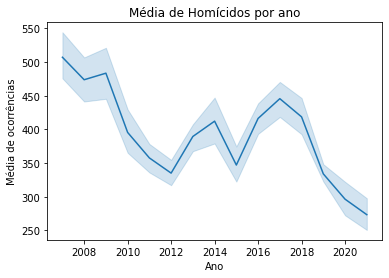

In [16]:
sns.lineplot(data=df_clean,x='ano',y='hom_doloso')
plt.title('Média de Homícidos por ano')
plt.xlabel('Ano')
plt.ylabel('Média de ocorrências')
plt.show()

Como vemos aqui em cima, desde 2007 para para cá (2021) parece que a média de homicídios esteja diminuindo.

Isso sugere um bom sinal, indicando que, talvez, o crime venha diminuindo. Apenas uma análise mais aprofundada pode nos dizer.

In [17]:
df_clean['data'] = df_clean['ano'].astype(str) +'-'+ df_clean['mes'].astype(str)

In [18]:
df_clean.head()

,ano,mes,hom_doloso,tentat_hom,arma_fabricacao_caseira,carabina,espingarda,fuzil,garrucha,garruchao,metralhadora,outros,pistola,revolver,submetralhadora,total,data
0,2007,1,526,307,51,10,118,15,30,1,7,18,180,428,0,858,2007-1
1,2007,2,486,301,91,12,151,17,23,1,2,17,151,478,1,944,2007-2
2,2007,3,640,408,111,13,111,30,37,1,4,29,208,508,2,1054,2007-3
3,2007,4,572,367,30,10,112,19,33,2,6,16,204,515,3,950,2007-4
4,2007,5,466,365,54,11,125,15,28,1,6,18,233,569,2,1062,2007-5


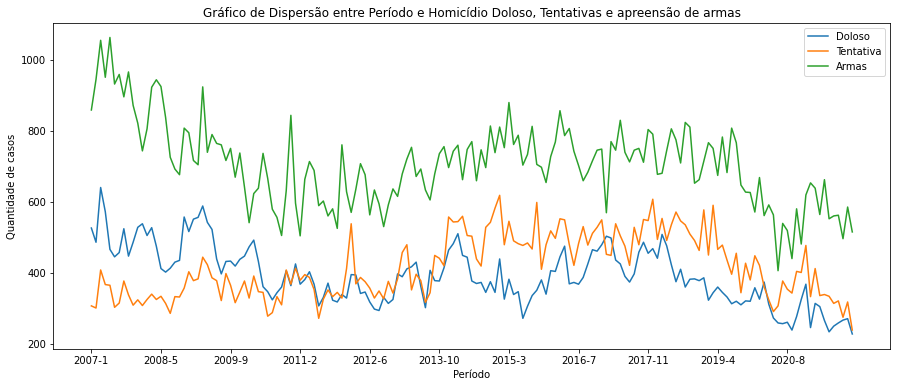

In [19]:
plt.figure(figsize=(15,6))
sns.lineplot(data=df_clean,x='data',y='hom_doloso', label='Doloso')
sns.lineplot(data=df_clean,x='data',y='tentat_hom', label='Tentativa')
sns.lineplot(data=df_clean,x='data',y='total', label= 'Armas')
plt.xticks(np.arange(0, df_clean.shape[0], step=15))
plt.title('Gráfico de Dispersão entre Período e Homicídio Doloso, Tentativas e apreensão de armas')
plt.xlabel('Período')
plt.ylabel('Quantidade de casos')
plt.legend()
plt.show()

## Visualização de Dados


Histogramas são poderosas ferramentas de visualização, que nos auxiliam a entender a distribuição dos valores em uma variável.

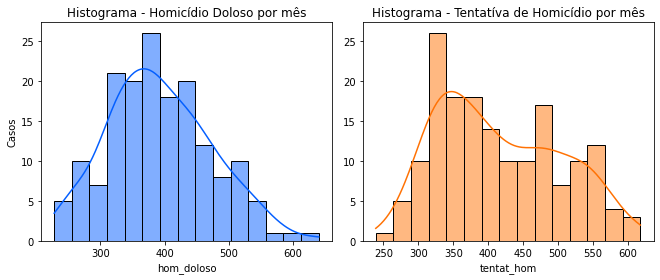

In [20]:
# Plotar histograma de hom_doloso
plt.figure(figsize=(9.5,4))
plt.subplot(1,2,1)
sns.histplot(x='hom_doloso',data=df_clean,kde=True,color='#045FFF',bins=15)
plt.title("Histograma - Homicídio Doloso por mês")
plt.ylabel("Casos")

plt.subplot(1,2,2)
sns.histplot(x='tentat_hom',data=df_clean,kde=True,color='#FF7204',bins=15)
plt.title("Histograma - Tentatíva de Homicídio por mês")
plt.ylabel('')

plt.tight_layout()
plt.show()


No gráfico acima, alguns dados chamam a nossa atenção, como:

* Houveram mais de 50 meses com 300-450 homicídios dolosos registrados ao longo do período em estudo.
* Há uma concentração 300-450 casos por mês, o que é um número alarmante pensando-se que são de 10 - 15 homicídios por dia.
* O número de tentativas de homicídio parecem menores, entretanto ainda apresentam um valor condesado na faixa dos 325 - 400.

## Pandas Profiling - Uma análise rápida em 3 linhas de código

Outra forma de analisar os dados coletados, de maneira rápida e prática é utilizando o [PandasProfiling](https://github.com/pandas-profiling/pandas-profiling). Um biblioteca que realiza uma EDA simples, rápida e interativa em apenas 3 linhas de código.

In [21]:
# Instalando dependências
!pip install folium --upgrade -q
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q

from pandas_profiling import ProfileReport

In [22]:
# Criar ProfileReport
report = ProfileReport(df_clean)

In [23]:
# Criar a visualização no próprimo Notebook
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Conclusão

A principal lição aprendida aqui foi a necessidade de se atentar a cada detalhe do seu *dataset* quando se está lidando com dados reais, extraídos diretamente de sites e portais com dados abertos.

Neste trabalho realizou-se apenas uma análise exploratória dos dados de segurança do Rio de Janeiro. Também notou-se que é possível que com o passar dos anos a criminalidade na capital esteja diminuindo. 

Por fim, lembra-se que esta é apenas uma análise superficial. Qualquer dúvida ou sugestão é bem vinda.

Meus contatos:
*   Email: thiagogglopes97@gmail.com
*   [Linkdin](https://www.linkedin.com/in/thiago-lopes-666547164/)
*   [Medium](https://medium.com/@thiagogglopes97)